# Strain analysis

Copyright 2021 Marco A. Lopez-Sanchez.  
Content under [Creative Commons Attribution license CC-BY 4.0](https://creativecommons.org/licenses/by/4.0/), code under [Mozilla Public License 2.0](https://www.mozilla.org/en-US/MPL/2.0/).

> **Goal**: Visualize and analise the evolution of strain using digital image correlation **Not yet finished!**

In [1]:
# Import neccesary libraries
import os
import numpy as np
import pandas as pd
from types import SimpleNamespace

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['xtick.labelsize'] = 24
plt.rcParams['ytick.labelsize'] = 24

## Load/import DIC data

The first step is to load the data as explained in the notebook [Loading data from DICe output](https://nbviewer.jupyter.org/github/marcoalopez/Jupyter4DICe/blob/f277d346a009570cf645123dc8fa93f7a0eea4f4/notebooks/LoadingDICe_data.ipynb). The main parameters of interest here are:

- In plane rotation (or rotation parallel to z axis)
- Virtual strain gauge (XX, YY, shear XY)

the region of interest considered looks as follows with grain boundaries outlined in yellow above the speckle random pattern for reference

![](https://github.com/marcoalopez/Jupyter4DICe/blob/main/notebooks/figs/ROI_sample4_lowres.jpg?raw=true)

The example dataset consist of a sequence of 10 time steps. The correlation was performed incrementally so that the deformation estimated by DICe represents incremental not cumulative deformations. The first five and the last five time steps represent different moments in the development of the deformation experiment (a link to the full paper will be provided soon!). In this example all DIC solutions are considered as correct and no data cleaning will be carried out, for this see the notebook "how to assess and visualise the quality of the DIC solution and clean the dataset".

> **DICe coordinate system**: Image coordinates in DICe are measured from the top left corner of the image with x positive to the right and y positive downward. Rotations are positive clockwise (opposite of the right-hand rule).

In [2]:
path = 'dataset/'

# loop to extract the data
count = 1
print('Stacking data...')

for filename in os.listdir(path):
    if filename.startswith('DICe') and filename.endswith('.txt'):
        
        # load the corresponding csv file
        df = pd.read_csv(path + filename, delimiter=',')
        
        # separate the different parameters of interest and reorganize them as a matrix
        rot_Z = df.pivot(index='COORDINATE_Y', columns='COORDINATE_X', values='ROTATION_Z')
        strainXX = df.pivot(index='COORDINATE_Y', columns='COORDINATE_X', values='VSG_STRAIN_XX')
        strainYY = df.pivot(index='COORDINATE_Y', columns='COORDINATE_X', values='VSG_STRAIN_YY')
        strainXY= df.pivot(index='COORDINATE_Y', columns='COORDINATE_X', values='VSG_STRAIN_XY')
        
        # generate the numpy arrays
        if count == 1:
            rotZ_stack = np.array(rot_Z)
            strainXX_stack = np.array(strainXX)
            strainYY_stack = np.array(strainYY)
            strainXY_stack = np.array(strainXY)
            print(f'first processing file: {filename}')
            print('it might take a while...') 

        else:
            rotZ_stack = np.dstack((rotZ_stack, np.array(rot_Z)))
            strainXX_stack = np.dstack((strainXX_stack, np.array(strainXX)))
            strainYY_stack = np.dstack((strainYY_stack, np.array(strainYY)))
            strainXY_stack = np.dstack((strainXY_stack, np.array(strainXY)))
        count += 1
        print('#', end = '')

print('')
print(f'last processing file: {filename}')
print('Done!')
print(f'Shape of arrays: {strainXX_stack.shape}')

# Store all the Numpy arrays within the variable "data" using SimpleNamespace
data = SimpleNamespace(rotZ=rotZ_stack,
                       strainX=strainXX_stack,
                       strainY=strainYY_stack,
                       strainXY=strainXY_stack)

# remove variables that are not going to be used (to release RAM memory)
del df, count, filename, rot_Z, strainXX, strainYY, strainXY, rotZ_stack, strainXX_stack, strainYY_stack, strainXY_stack

Stacking data...
first processing file: DICe_solution_000.txt
it might take a while...
##########
last processing file: DICe_solution_074.txt
Done!
Shape of arrays: (377, 189, 10)


## Generate a Numpy array with the Von Mises 2D equivalent strain

To present the evolution of strain heterogeneities it is convenient to visualize the local strain by combining different components of the strain (XX, YY, XY) of the observed surface. For this we use the Von Mises 2D equivalent strain $\varepsilon_{eq}$ that can be estimated from the VSG strains using

$$
\varepsilon_{eq} = \sqrt{\frac{2}{3} \left( \varepsilon_{xx}^2 + \varepsilon_{yy}^2 + 2\varepsilon_{xy}^2 \right) }
$$

Let's create a Python function for this and then estimate the equivalent strain and store it within the ``data`` namespace with the field ``eq_strain``.

In [3]:
def VM_eq_strain(strain_xx, strain_yy, strain_xy):
    """ Estimate and plot the Von Mises 2D equivalent strain.

    Parameters
    ----------
    strain_xx : 2-dim numpy array
        The xx Green-Lagrange (VSG) strain component
    strain_yy : 2-dim numpy array
        The yy Green-Lagrange (VSG) strain component
    strain_xy : 2-dim numpy array
        The xy (shear) Green-Lagrange (VSG) strain component
    """

    return np.sqrt((2 / 3) * (strain_xx**2 + strain_yy**2 + 2 * strain_xy**2))

# vectorize the function for easy use with numpy arrays
vect_eq_strain = np.vectorize(VM_eq_strain)

In [4]:
# create the array with the equivalent strain and store it within the "data" object
data.eq_strain = vect_eq_strain(data.strainX, data.strainY, data.strainXY)

print("Shape of the 'eq_strain' array:", data.eq_strain.shape)

Shape of the 'eq_strain' array: (377, 189, 10)


For testing purposes, let's plot the equivalent strain for the first time steps

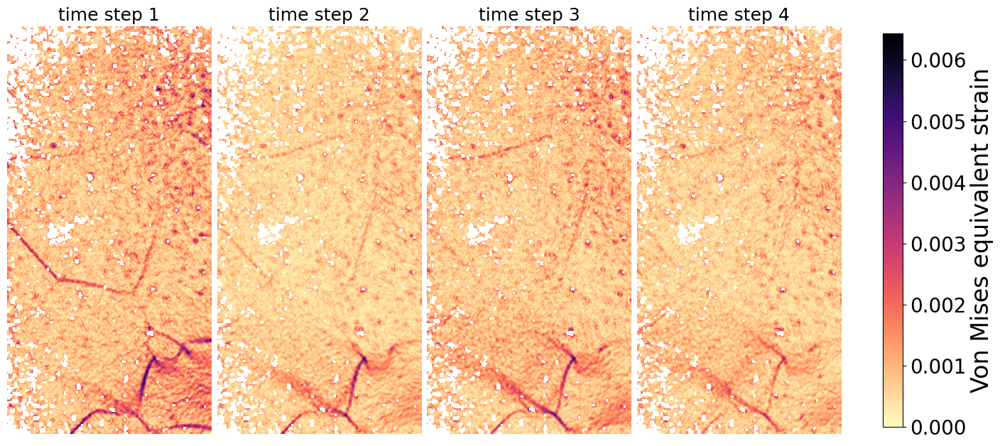

In [5]:
# initialize a figure with four axes (specifically 4 columns)
fig1, axes = plt.subplots(ncols=4, sharey=True, figsize=(14, 8), constrained_layout=True)

# loop through the axes to plot the different time steps
for index, ax in enumerate(axes.flat):
    ax.set_axis_off()
    im = ax.imshow(data.eq_strain[:, :, index], cmap='magma_r')
    ax.set_title(f'time step {index + 1}', fontsize=18)

# add color bar
cbar = fig1.colorbar(im, ax=axes, shrink=0.7, location='right')
cbar.set_label('Von Mises equivalent strain', fontsize=24)
cbar.ax.tick_params(labelsize=20)

Also, for comparison let's make a plot comparing the virtual strain gauges (VSG) XX, YY, XY estimated bu DICe and the equivalent stress for the time step 1 (index 0)

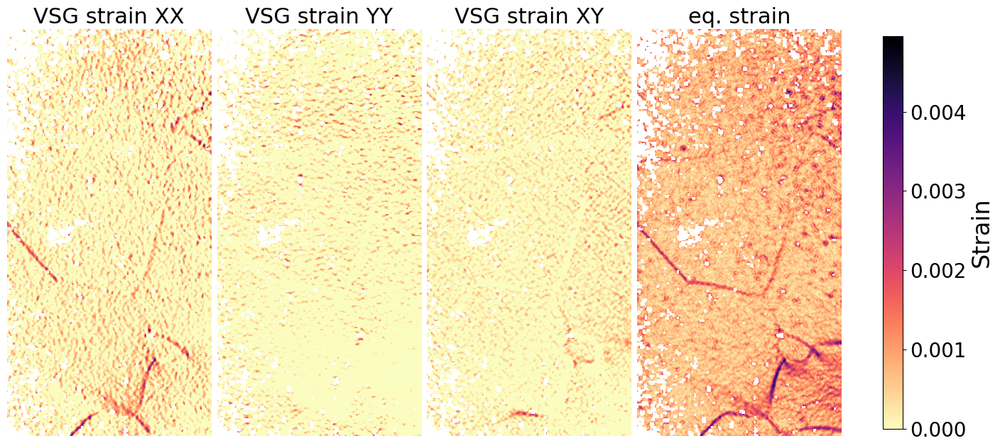

In [6]:
to_plot = (data.strainX[:, :, 0],
           data.strainY[:, :, 0],
           data.strainXY[:, :, 0],
           data.eq_strain[:, :, 0])

names = ['VSG strain XX', 'VSG strain YY', 'VSG strain XY', 'eq. strain']

# initialize figure
fig2, axes = plt.subplots(ncols=4, sharey=True, figsize=(14, 8), constrained_layout=True)

# plot all maps with the same colorscale (i.e. same cmin and vmax values, max value normalized to eq. strain)
for index, ax in enumerate(axes.flat):
    ax.set_axis_off()
    im = ax.imshow(to_plot[index], vmin=0, vmax=np.nanmax(data.eq_strain[:, :, 0]), cmap='magma_r')
    ax.set_title(names[index], fontsize=22)
    ax.set_aspect('equal')

# add color bar
cbar = fig2.colorbar(im, ax=axes, shrink=0.7, location='right')
cbar.set_label('Strain', fontsize=24)
cbar.ax.tick_params(labelsize=20)

## Generate an array with the cumulative equivalent strain

As previously indicated, the digital image correlation in this case was done incrementally. If we want to visualise the cumulative deformation we can use the Numpy ``cumsum`` method on axis 2, which represents the evolution of strain with time.

In [7]:
# create a cumulative (finite) equivalent strain
data.fstrain = np.cumsum(data.eq_strain, axis=2)

# check the shape of the array
data.fstrain.shape

(377, 189, 10)

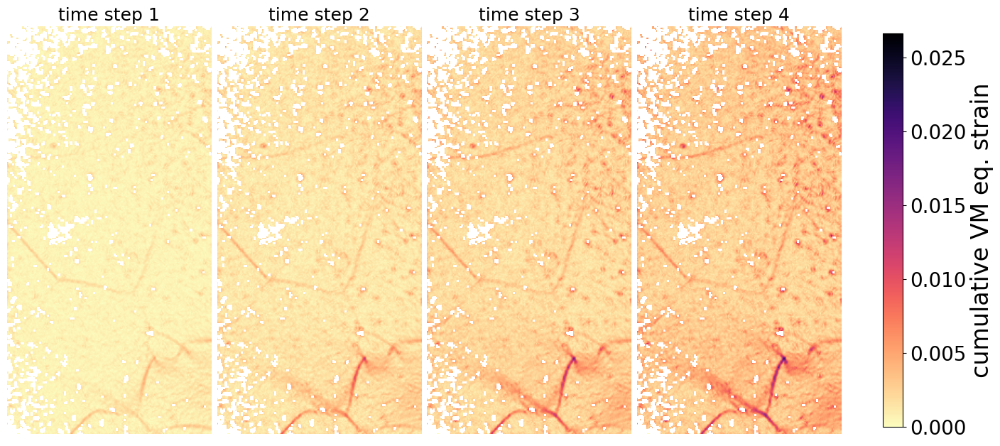

In [8]:
# initialize a 1x4 figure
fig3, axes = plt.subplots(ncols=4, sharey=True, figsize=(14, 8), constrained_layout=True)

for index, ax in enumerate(axes.flat):
    ax.set_axis_off()
    im = ax.imshow(data.fstrain[:, :, index], vmax=np.nanmax(data.fstrain[:, :, 4]), cmap='magma_r')
    ax.set_title(f'time step {index + 1}', fontsize=18)

# add color bar
cbar = fig3.colorbar(im, ax=axes, shrink=0.7, location='right')
cbar.set_label('cumulative VM eq. strain', fontsize=24)
cbar.ax.tick_params(labelsize=20)

> 👉 If you performed an absolute correlation and want to estimate the incremental deformation (or displacement, etc.) you can do it with the Numpy ``diff`` method that estimates the n-th discrete difference along the given axis, more details here https://numpy.org/doc/stable/reference/generated/numpy.diff.html

## Normalize the equivalent strain using the average strain

Equivalent strain normalization serves to illustrate which parts of the region of interest develop strain above and below the average strain. The first thing to do is to check what type of distribution presents the variable in question in order to choose the best suited average. Generally speaking, if normal-like we should use the arithmetic mean but if lognormal-like we should opt for the median or the geometric mean instead.

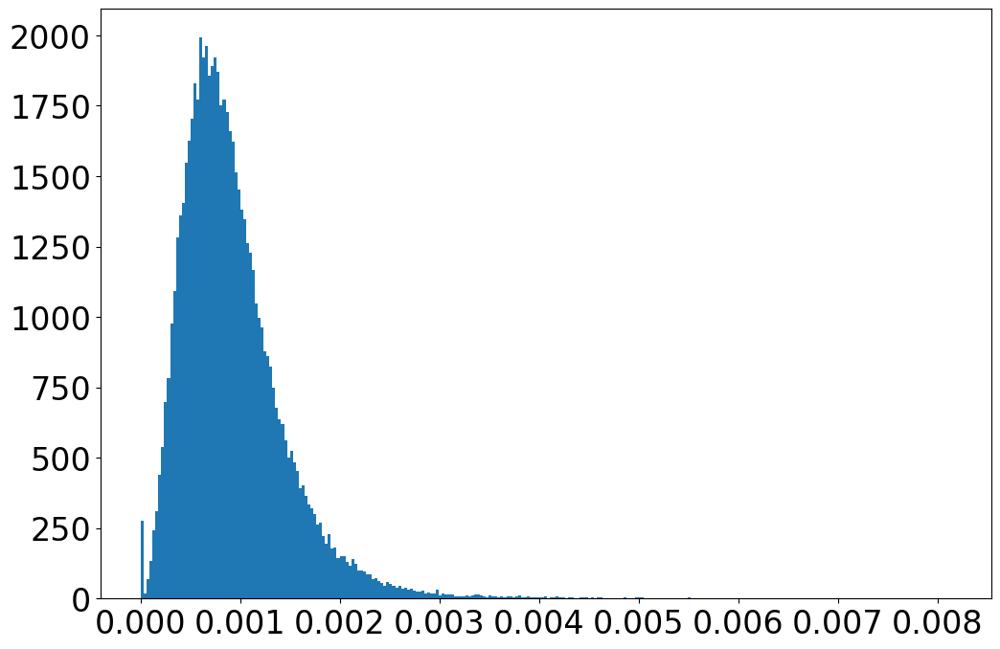

In [9]:
# plot an histogram of one of the slices of the equivalent strain (_ = ... hides the output)
_ = plt.hist(data.eq_strain[:, :, 1].ravel(), bins='auto')  # 'auto' uses the Freedman-Diaconis rule to estimate an optimal number of bins

In this case, the distribution of equivalent strain values is clearly lognormal, although there are some zero values (likely DIC correlation artefacts or deformations too small to be detected by the DIC) that break the lognormal assumption. Due to this, we will use the median rather than the geometric mean, as the latter does not allow zero values. More specifically we will use the Numpy ``nanmedian`` method to ignore the ``nan`` values in the dataset. To estimate the normalized equivalent strain for each time step, we have to normalize over the ``axis=2`` (y, x, time steps). To do this, we will need to specify the axes along which the medians are calculated, in this case the 0 and 1 axes, and we will divide (normalise) the equivalent deformation array by this. Internally, NumPy compares their shapes element-wise using broadcasting rules, so that if we estimated the median over time and then divide the equivalent strain array by this result we also normalize over time.

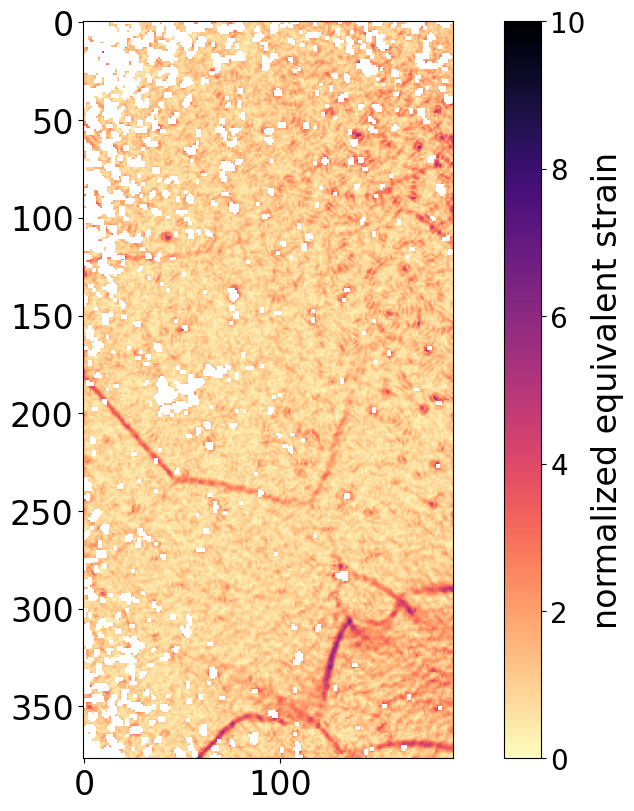

In [10]:
# Estimate the normalized equivalent strain using numpy broadcasting (377, 189, 10) / (10,)
data.norm_eqStrain = data.eq_strain / np.nanmedian(data.eq_strain, axis=[0, 1])

# initialize figure
fig4, ax = plt.subplots(constrained_layout=True)

# image (take slice 1 --> [:, :, 0])
im = ax.imshow(data.norm_eqStrain[:, :, 0], vmin=0, vmax=10, cmap='magma_r')

# add color bar
cbar = fig4.colorbar(im, ax=ax)
cbar.set_label('normalized equivalent strain', fontsize=24)
cbar.ax.tick_params(labelsize=20)

In the map above we see that the local incremental deformation is almost up to an order of magnitude larger than the median. To further facilitate the visualisation of the normalized equivalent strain, let's plot the same in a logarithmic color scale so that values below and above the average strain (== 1) shown in blue and red, respectively.

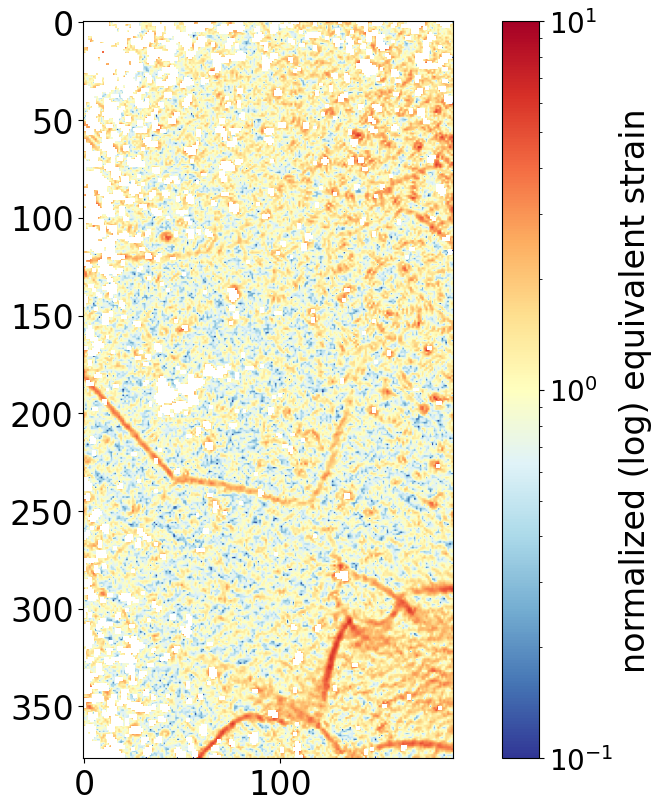

In [11]:
import matplotlib.colors as colors

fig5, ax = plt.subplots(constrained_layout=True)

im = ax.imshow(data.norm_eqStrain[:, :, 0], norm=colors.LogNorm(vmin=1e-1, vmax=10), cmap='RdYlBu_r')

# add color bar
cbar = fig5.colorbar(im, ax=ax)
cbar.set_label('normalized (log) equivalent strain', fontsize=24)
cbar.ax.tick_params(labelsize=20)

Now, let's visualise the whole dataset to see the evolution of strain with time using the normalised equivalent strain. As we are dealing with 10 time steps we will make a figure of 2x5 axes. Note that as alredy indicated the first five and the last five time steps represent different moments in the development of the deformation.

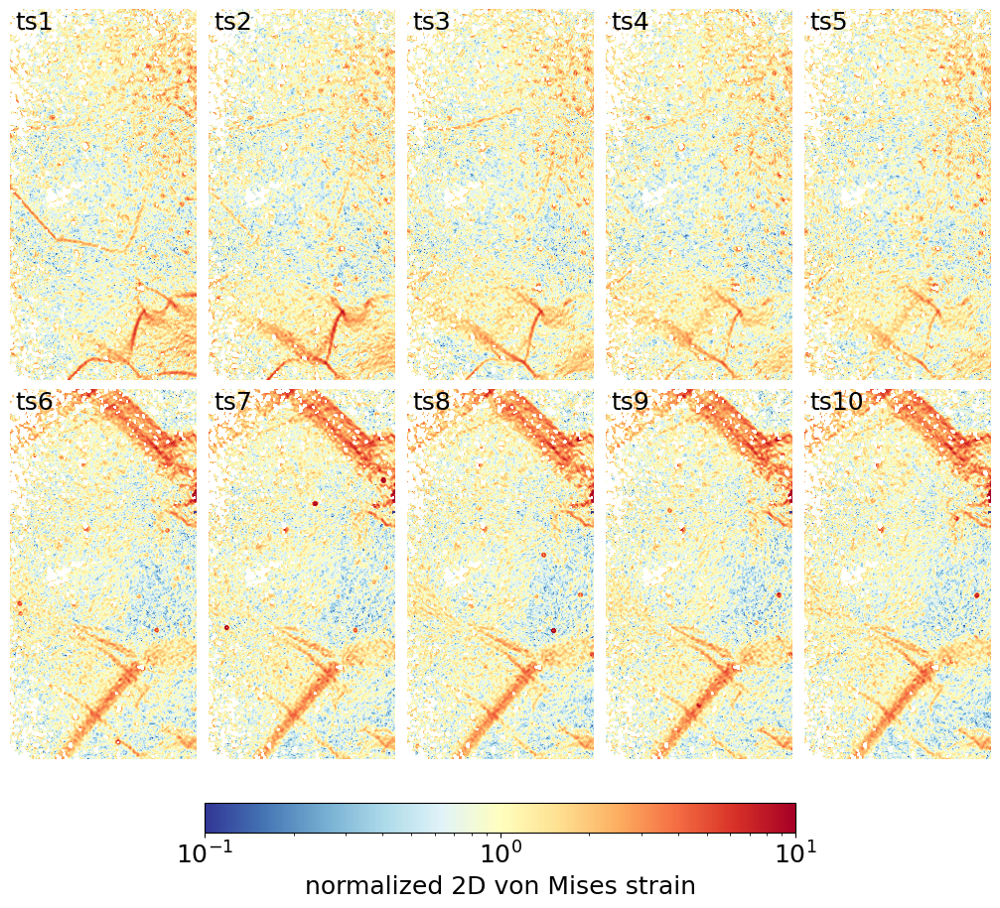

In [12]:
# initialize figure
fig6, axes = plt.subplots(nrows=2, ncols=5, sharex=True, sharey=True, figsize=(10, 9), constrained_layout=True)

for index, ax in enumerate(axes.flat):
    ax.set_axis_off()
    im = ax.imshow(data.norm_eqStrain[:, :, index], norm=colors.LogNorm(vmin=1e-1, vmax=10), cmap='RdYlBu_r')
    ax.text(x=5, y=20, s=f'ts{index + 1}', fontsize=18)
    ax.set_aspect('equal')

# add color bar
cbar = fig6.colorbar(im, ax=axes, shrink=0.6, location='bottom')
cbar.set_label('normalized 2D von Mises strain', fontsize=18)
cbar.ax.tick_params(labelsize=18)

Now let's plot the in-plane rotation of the strain so that we observe the shear band kinematics. Since rotations are positive clockwise and negative anticlockwise, we will use a divergent colour map centred on zero so that different colours represent different kinematics.

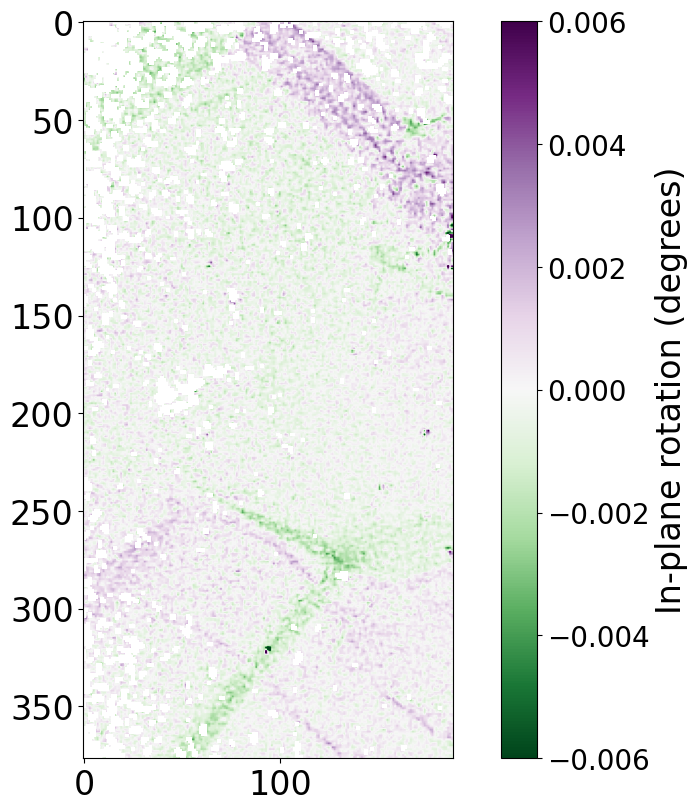

In [13]:
# initialize figure
fig, ax = plt.subplots(constrained_layout=True)

# image (take slice 8 --> [:, :, 7])
im = ax.imshow(data.rotZ[:, :, 8], vmin=-6e-3, vmax=6e-3, cmap='PRGn_r')

# add the color bar
cbar = fig.colorbar(im, ax=ax)
cbar.set_label('In-plane rotation (degrees)', fontsize=24)
cbar.ax.tick_params(labelsize=20)

In the above example we set the min and max values of the colormap manually to ± 6e-3. We can automate this by doing the following

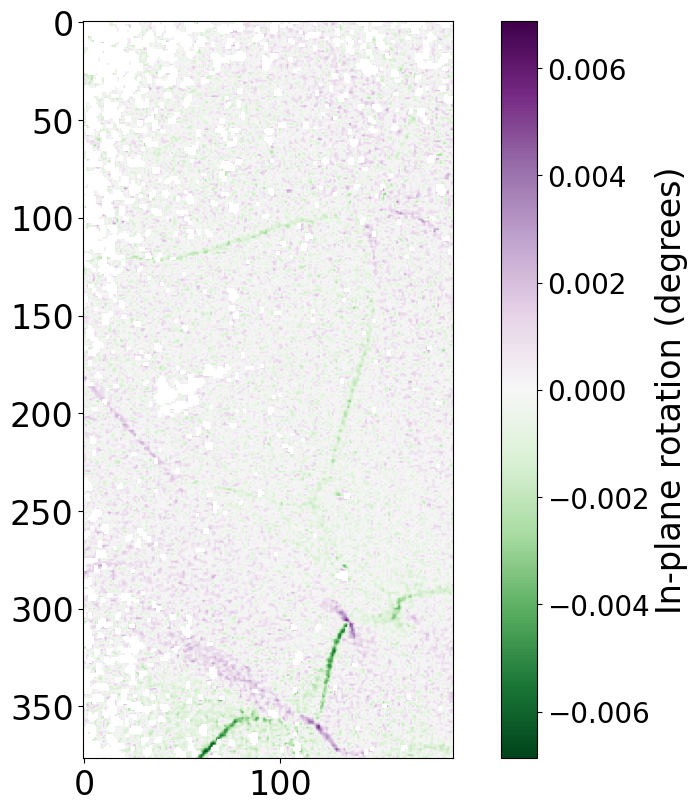

In [14]:
# initialize figure
fig, ax = plt.subplots(constrained_layout=True)

# image
im = ax.imshow(data.rotZ[:, :, 1], cmap='PRGn_r')

# set colorbar limit based on limit values (this centers the colour map at zero == no rotation)
if np.abs(np.nanmin(data.rotZ[:, :, 1])) >= np.nanmax(data.rotZ[:, :, 1]):
    im.set_clim(np.nanmin(data.rotZ[:, :, 1]), np.abs(np.nanmin(data.rotZ[:, :, 1])))
else:
    im.set_clim(-np.nanmax(data.rotZ[:, :, 1]), np.nanmax(data.rotZ[:, :, 1]))

# add the color bar
cbar = fig.colorbar(im, ax=ax)
cbar.set_label('In-plane rotation (degrees)', fontsize=24)
cbar.ax.tick_params(labelsize=20)

## Using convolution (from astropy) to fill and smooth the data

Now, we are going to see how to fill or smooth the DIC strain data using convolution algorithms from the [astropy](https://docs.astropy.org/en/stable/convolution/index.html) library. For this, we will use a different dataset consisting of a deformation sequence of a single individual grain in a polycrystalline aggregate. In this case, the correlation has been done relative to the undeformed state (not incrementally). Due to the degradation of the random speckle pattern over time, the DIC solution also degrades rapidly resulting in some missing values and increased noise in the signal. Let's check it step-by-step.

In [15]:
path = 'dataset2/'

# loop to extract the data
count = 1
print('Stacking data...')

for filename in os.listdir(path):
    if filename.startswith('DICe') and filename.endswith('.txt'):
        
        # load the corresponding csv file
        df = pd.read_csv(path + filename, delimiter=',')
        
        # separate the different parameters of interest and reorganize them as a matrix
        strainXX = df.pivot(index='COORDINATE_Y', columns='COORDINATE_X', values='VSG_STRAIN_XX')
        strainYY = df.pivot(index='COORDINATE_Y', columns='COORDINATE_X', values='VSG_STRAIN_YY')
        strainXY= df.pivot(index='COORDINATE_Y', columns='COORDINATE_X', values='VSG_STRAIN_XY')
        statusFlag = df.pivot(index='COORDINATE_Y', columns='COORDINATE_X', values='STATUS_FLAG')
        gamma = df.pivot(index='COORDINATE_Y', columns='COORDINATE_X', values='GAMMA')
        uncertainty = df.pivot(index='COORDINATE_Y', columns='COORDINATE_X', values='UNCERTAINTY')
        
        # generate the numpy arrays
        if count == 1:
            strainXX_stack = np.array(strainXX)
            strainYY_stack = np.array(strainYY)
            strainXY_stack = np.array(strainXY)
            stFlag_stack = np.array(statusFlag)
            gamma_stack = np.array(gamma)
            uncertainty_stack = np.array(uncertainty)
            print(f'first processing file: {filename}')
            print('it might take a while...')      
        else:
            strainXX_stack = np.dstack((strainXX_stack, np.array(strainXX)))
            strainYY_stack = np.dstack((strainYY_stack, np.array(strainYY)))
            strainXY_stack = np.dstack((strainXY_stack, np.array(strainXY)))
            stFlag_stack = np.dstack((stFlag_stack, np.array(statusFlag)))
            gamma_stack = np.dstack((gamma_stack, np.array(gamma)))
            uncertainty_stack = np.dstack((uncertainty_stack, np.array(uncertainty)))
        count += 1
        print('#', end = '')
        #print('file', filename, 'processed...')

print('')
print(f'last processing file: {filename}')
print('Done!')
print(f'Shape of arrays: {strainXX_stack.shape}')

# Store all the Numpy arrays within the variable "data" using SimpleNamespace
grain = SimpleNamespace(strainX=strainXX_stack,
                        strainY=strainYY_stack,
                        strainXY=strainXY_stack,
                        stFlag=stFlag_stack,
                        gamma=gamma_stack,
                        uncertainty=uncertainty_stack)

# remove variables that are not going to be used (to release RAM memory)
del df, count, filename, strainXX, strainYY, strainXY, statusFlag, gamma, uncertainty

Stacking data...
first processing file: DICe_solution_000.txt
it might take a while...
#####
last processing file: DICe_solution_119.txt
Done!
Shape of arrays: (158, 160, 5)


Before moving on to the strain description, let's clean first the data that is not well enough constrained using the fields ``status flag`` and ``uncertainty``. We will remove all correlations with a ``status flag`` above 4 and with uncertainty values above the percentile 99.8 %. Strictly speaking, we will replace these values with ``nans`` (_not a number_) using the Numpy place method.

In [16]:
# Numpy place works like this: np.place(array, condition, values to put in the array when the condition is met)

# remove values with status flags above 4
np.place(grain.strainX, grain.stFlag > 4, np.nan)
np.place(grain.strainY, grain.stFlag > 4, np.nan)
np.place(grain.strainXY, grain.stFlag > 4, np.nan)

# remove values with extreme uncertainty values (above the percentile 99.8%)
upper_cut = np.nanpercentile(grain.uncertainty.flatten(), q=99.8)
print(f'Uncertainty upper_cut = {upper_cut:.4f}')

np.place(grain.strainX, grain.uncertainty > upper_cut, np.nan)
np.place(grain.strainY, grain.uncertainty > upper_cut, np.nan)
np.place(grain.strainXY, grain.uncertainty > upper_cut, np.nan)

Uncertainty upper_cut = 0.0106


In [17]:
# estimate the equivalent strain
grain.eq_strain = vect_eq_strain(grain.strainX, grain.strainY, grain.strainXY)

In [18]:
# estimate the percentile 99.9 % eq. strain to use as the upper limit of the colour scale
upper_cut = np.around(np.nanpercentile(grain.eq_strain[:, :, -1], 99.9), decimals=2)

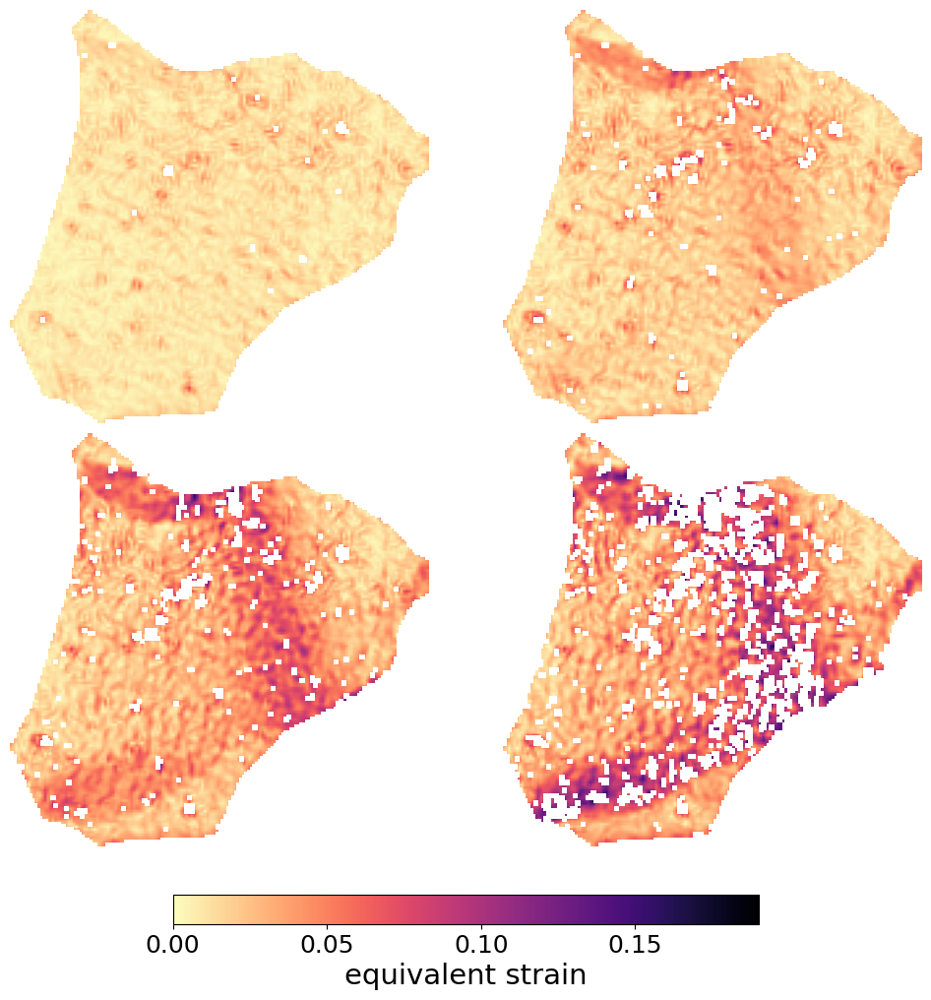

In [19]:
# initialize figure
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(10, 10), constrained_layout=True)

for index, ax in enumerate(axes.flat):
    ax.set_axis_off()
    im = ax.imshow(grain.eq_strain[:, :, index + 1], vmin=0, vmax=upper_cut, cmap='magma_r')

# add color bar
cbar = fig.colorbar(im, ax=axes, shrink=0.6, location='bottom')
cbar.set_label('equivalent strain', fontsize=21)
cbar.ax.tick_params(labelsize=18)

As can be seen, the DIC solution degrades with deformation, with quite a few missing values appearing in most strained areas, particularly for the last example. If we want to estimate the evolution of the average equivalent strain over time this can be a problem, because missing the highest strain values will produce equivalent strain averages below their true value. We, therefore, need to fill in these missing values based on the data we have. For this, we will use a 2D Gaussian filter to set the kernel/area to estimate the missing values and the astropy convolve routine. To define the Gaussian kernel we need to enter the kernel size ``x_size`` and the standard deviation of the Gaussian kernel. Let's check this on the most deformed grain.

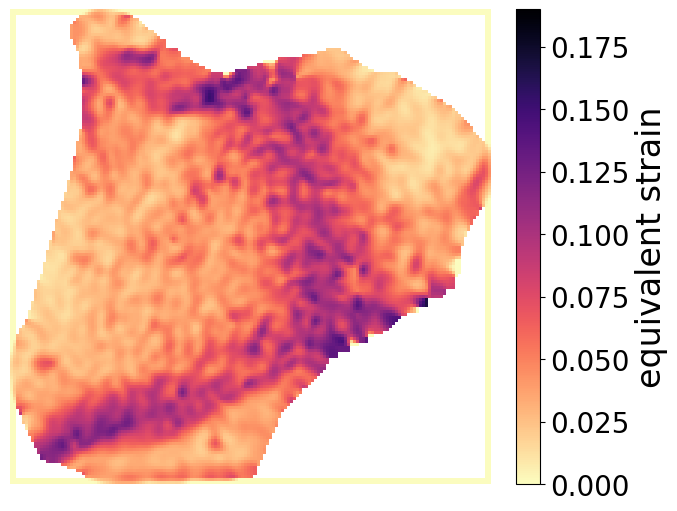

In [20]:
from astropy.convolution import Gaussian2DKernel, Box2DKernel, convolve

kernel = Gaussian2DKernel(x_stddev=1.5, x_size=5)
grain_conv = convolve(grain.eq_strain[:, :, -1], kernel)

# initialize figure
fig, ax = plt.subplots(figsize=(7, 5), constrained_layout=True)

# image
ax.set_axis_off()
im = ax.imshow(grain_conv, vmin=0, vmax=upper_cut, cmap='magma_r')

# add color bar
cbar = fig.colorbar(im, ax=ax)
cbar.set_label('equivalent strain', fontsize=24)
cbar.ax.tick_params(labelsize=20)

In the figure above we see a yellow square containing the grain. This is an artefact produced by convolving irregular (non-square) images; the algorithm used assigns the value zero to extreme values. To get rid of this artefact, let's find the zero strain values and change them to nans using the Numpy place method.

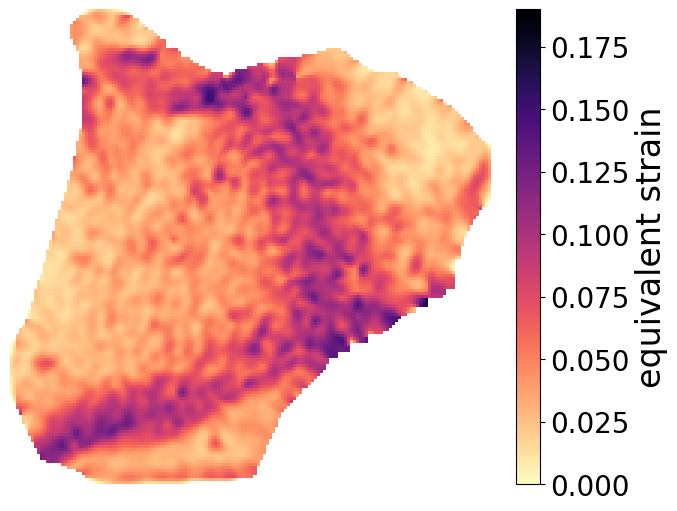

In [21]:
np.place(grain_conv, grain_conv == 0.0, np.nan)

# initialize figure
fig, ax = plt.subplots(figsize=(7, 5), constrained_layout=True)

# image
ax.set_axis_off()
im = ax.imshow(grain_conv, vmin=0, vmax=upper_cut, cmap='magma_r')

# add color bar
cbar = fig.colorbar(im, ax=ax)
cbar.set_label('equivalent strain', fontsize=24)
cbar.ax.tick_params(labelsize=20)

Now let's check how the distribution of strain values looks like

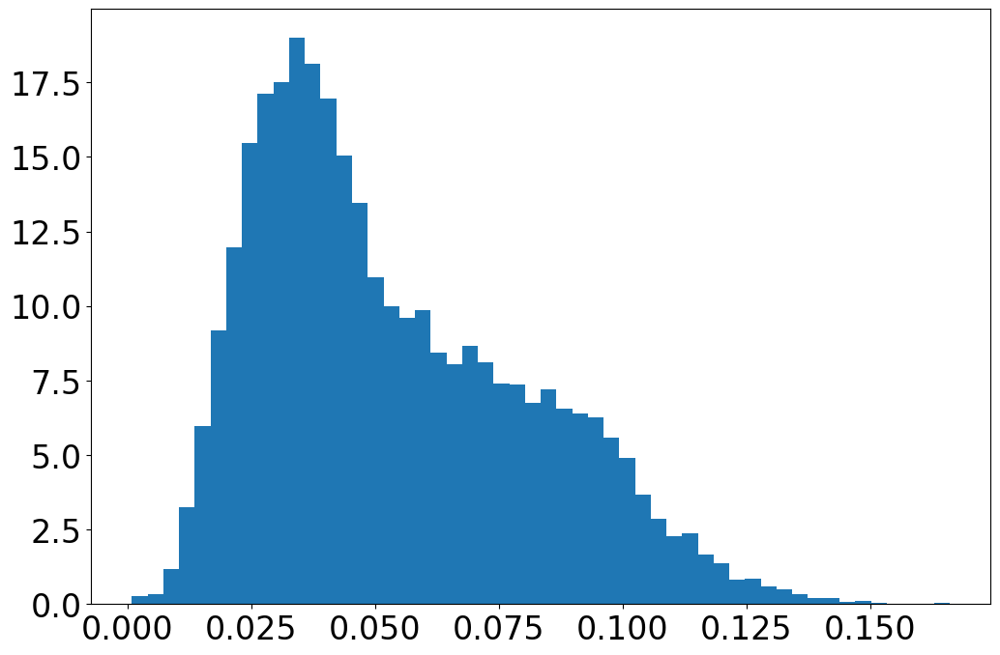

In [22]:
_ = plt.hist(grain_conv.ravel(), bins='fd', density=True)

In [23]:
median, gmean = np.nanmedian(grain_conv), np.exp(np.nanmean(np.log(grain_conv)))
print(f'equivalent strain (median) = {median:.4f}')
print(f'equivalent strain (geo mean) = {gmean:.4f}')

equivalent strain (median) = 0.0467
equivalent strain (geo mean) = 0.0466


In [24]:
def convolve_over_time(array, std=1.5, size=5):
    """ Using Astropy's Gaussian2DKernel and convolve methods
    it convolves any quantity of interest stored in an 3-dim
    array over time (assuming that time is axis 2). It uses
    a for loop and returns a 3-dim array. This is therefore
    a non optimised ad hoc solution by way of example.
    
    Parameters
    ----------
    array : 3-dim numpy array
        the array containing the quantity of interest
    std : scalar, int or float, optional
        standard deviation of the Gaussian kernel
    size : odd integer
        size of the kernel    
    """
    
    kernel = Gaussian2DKernel(x_stddev=std, x_size=size)
    
    for index in range(array.shape[-1]):
        if index == 0:
            conv_arr_stack = convolve(array[:, :, index], kernel)
        else:
            conv_arr = convolve(array[:, :, index], kernel)
            conv_arr_stack = np.dstack((conv_arr_stack, conv_arr))
    
    np.place(conv_arr_stack, conv_arr_stack == 0.0, np.nan)
    
    return conv_arr_stack

In [25]:
grain.conv_strain = convolve_over_time(grain.eq_strain)

In [26]:
grain.conv_strain.shape

(158, 160, 5)

To check, let's plot the convolved strain and compare the averages of the original and the smoothed and restored data.

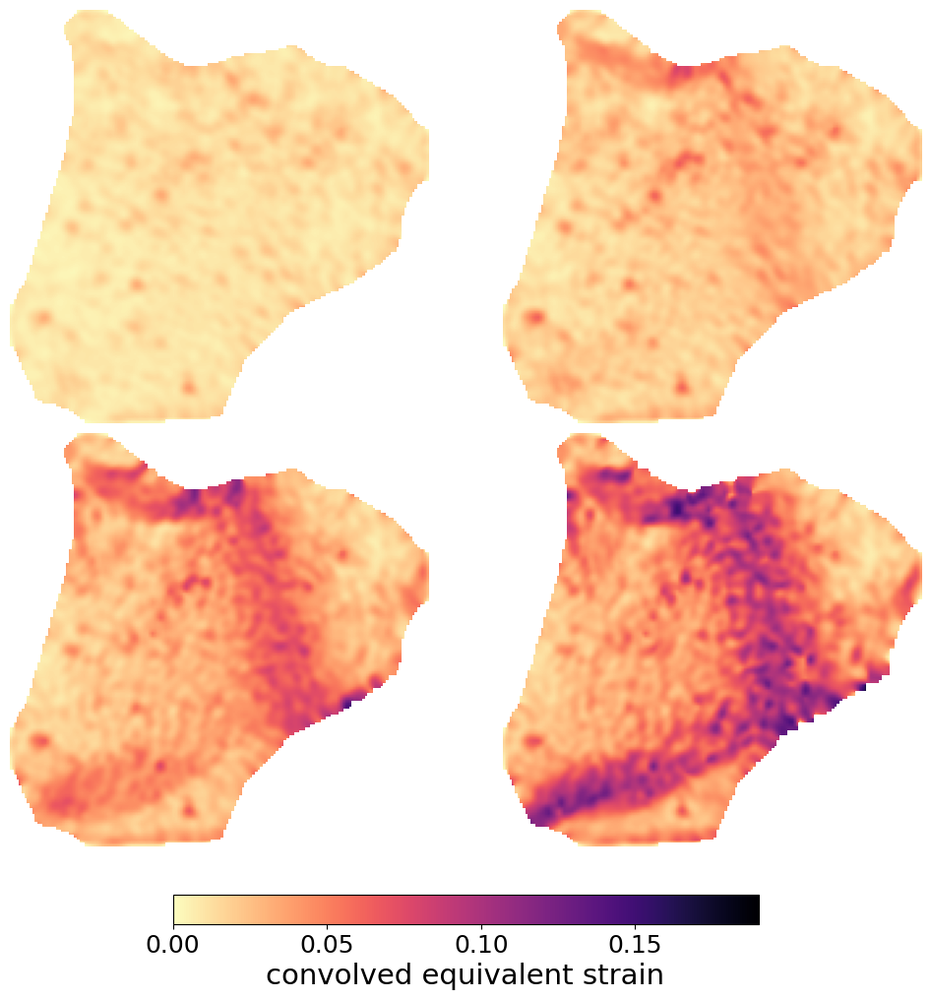

In [27]:
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(10, 10), constrained_layout=True)

for index, ax in enumerate(axes.flat):
    ax.set_axis_off()
    im = ax.imshow(grain.conv_strain[:, :, index + 1], vmin=0, vmax=upper_cut, cmap='magma_r')

# add color bar
cbar = fig.colorbar(im, ax=axes, shrink=0.6, location='bottom')
cbar.set_label('convolved equivalent strain', fontsize=21)
cbar.ax.tick_params(labelsize=18)

In [28]:
# print the equivalent strain median of the last time step to compare
median, conv_median = np.nanmedian(grain.eq_strain[:, :, -1]), np.nanmedian(grain.conv_strain[:, :, -1])
print(f'equivalent strain (median) = {median:.4f}')
print(f'equivalent strain (median) using the convolved array = {conv_median:.4f}')

equivalent strain (median) = 0.0448
equivalent strain (median) using the convolved array = 0.0467


As can be seen, the median is slightly higher using the convoluted data as most missing values in the original data are in the high strained zones. Let's now plot the evolution of the medians over time.

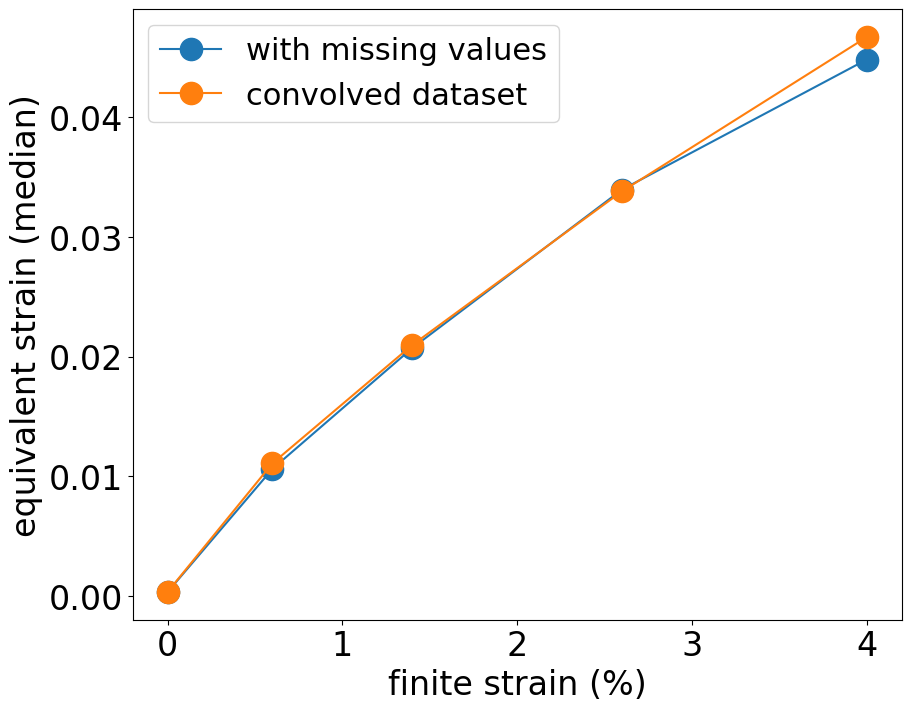

In [29]:
# estimate the medians over time
raw_medians = np.nanmedian(grain.eq_strain, axis=[0,1])
clean_medians = np.nanmedian(grain.conv_strain, axis=[0,1])
strain = [0, 0.6, 1.4, 2.6, 4.0]

# plot the evolution over time
fig, ax = plt.subplots(figsize=(9, 7), constrained_layout=True)

ax.plot(strain, raw_medians, 'o-', markersize=16, label='with missing values')
ax.plot(strain, clean_medians, 'o-', markersize=16, label='convolved dataset')

ax.set_xlabel('finite strain (%)', fontsize=24)
ax.set_ylabel('equivalent strain (median)', fontsize=24)
_ = ax.legend(loc='best', fontsize=22)

# TODO

In [30]:
import sys
import matplotlib as mpl

print('Notebook tested using:')
print('Python', sys.version)
print('Numpy', np.__version__)
print('Pandas', pd.__version__)
print('Matplotlib', mpl.__version__)

Notebook tested using:
Python 3.10.13 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:24:38) [MSC v.1916 64 bit (AMD64)]
Numpy 1.26.0
Pandas 2.1.1
Matplotlib 3.8.0
